<a href="https://colab.research.google.com/github/pabloubilla/AI-Environment/blob/main/Copy_of_AI_for_Bioacoustics.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<a href="https://colab.research.google.com/github/MScEcologyAndDataScienceUCL/BIOS0032_AI4Environment/blob/main/4_AI_for_Bioacoustics/AI_for_Bioacoustics.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Week 4 - AI for Bioacoustics

## What we will learn

In this weeks practical we will explore computer audition applications in ecology such as automated animal detection and species classification from audio sensor data. Among other stuff we will:

1. Learn how to visualize audio data.
2. Apply an automated animal detector on a set of audio files.
3. Learn to evaluate the performance of a sound detector.
4. Use a trained neural network to detect animals.
5. Manually extract relevant sound features.
6. Use features to create an automated animal sound identifier.
7. Compare between hand-crafted feature sets with learned features.

If time permits, we will have some time exploring how to train a neural network for audio classification.

## Intro

### Computer audition

**What is Computer audition?**

- Computer audition is the field of research that deals with the automatic
  analysis of audio signals.

- It intersects with many other fields, including machine learning, signal
  processing, and computer vision.

**What does a computer hear**?

- Audio files are a sequence of numbers representing the amplitude of the sound
  wave at a given time.

- The number of samples per second is called the **sampling rate**.

<img alt="audio and sampling rate" width="600" src="https://cdn.shopify.com/s/files/1/1169/2482/files/Sampling_Rate_Cover_image.jpg?v=1654170259"></img>

**What tasks can we do with computer audition?**

Computer audition is used in a wide range of applications, including:

- Speech recognition: Siri, Alexa, Google Assistant
- Music information retrieval: Spotify, Shazam
- Audio classification: What is sounding in this audio?
- Sound event detection: Transcription of audio into a sequence of events.

<img alt="Sound event detection" width="400" src="http://d33wubrfki0l68.cloudfront.net/508a62f305652e6d9af853c65ab33ae9900ff38e/17a88/images/tasks/challenge2016/task3_overview.png"></img>

> Taken from the paper: Mesaros, A., Heittola, T., Diment, A., Elizalde, B., Shah, A., Vincent, E., ... & Virtanen, T. (2017, November). DCASE 2017 challenge setup: Tasks, datasets and baseline system. In DCASE 2017-Workshop on Detection and Classification of Acoustic Scenes and Events.

Recently neural network models have taken over the field of computer audition and are being used to solve many of the above tasks.

### Data collection

**Acoustic sensors** can be used to collect field recordings of animal sounds.

Usually, these sensors are deployed statically in the field for a long periods of time and record sounds continuously. This is called **passive acoustic monitoring**.

<img alt="passive acoustic monitoring" width="400" src="https://wittmann-tours.de/wp-content/uploads/2018/06/AudioMoth.jpg"></img>

Alternatively, recordings are actively directed towards a specific animal species or sound events.

<img alt="active recording" width="400" src="https://s3.amazonaws.com/cdn.freshdesk.com/data/helpdesk/attachments/production/48032687175/original/xjI7Dy3Q9kaCZinr5vf4ksNxQbjK13Yv3A.jpg?1584552543"></img>

> Taken from the Macaulay Library blog post:
> [Sound recording tips](https://support.ebird.org/en/support/solutions/articles/48001064298-sound-recording-tips)

### Acoustics for ecology

The sound at a site is a reflection of the species present in the area and other
environmental factors.

<img alt="composition of acoustic space" width="400" src="https://media.springernature.com/full/springer-static/image/art%3A10.1007%2Fs12304-017-9288-5/MediaObjects/12304_2017_9288_Fig1_HTML.gif?as=webp"></img>

> Taken from the paper: Mullet, T.C., Farina, A. & Gage, S.H. The Acoustic
> Habitat Hypothesis: An Ecoacoustics Perspective on Species Habitat Selection.
> Biosemiotics 10, 319–336 (2017). https://doi.org/10.1007/s12304-017-9288-5

If we could link the sounds to the species, we could use this information to
study and monitor the biodiversity of an area.

Acoustic sensors produce a lot of data, and it is not always easy to analyse.
Can we use computer audition to help us?

In this practical we will explore the task of **animal sound detection** and
**species classification**, using both manual and automated methods.

## Setup Steps

Here we will go through the steps to setup the environment for this practical.

### Make sure to use GPU runtime in Colab.

Go to `Runtime` -> `Change runtime type` and select `GPU` as the hardware accelerator.

### Mount your Google Drive.

In [ ]:
from google.colab import drive

drive.mount("/content/drive")

Mounted at /content/drive


Add a shortcut in you drive to this [shared folder](https://drive.google.com/drive/folders/1hbbbsILNBsQghktuj0z_Jq_3iEZQCCbj?usp=share_link).

This will allow you to access the data we will use in this practical.

In [ ]:
%%capture
# Extract data into machine
!unzip /content/drive/MyDrive/BIO0032_AI4Environment/week4_data.zip -d /content/week4_data

Archive:  /content/drive/MyDrive/BIO0032_AI4Environment/week4_data.zip
   creating: /content/week4_data/data/
   creating: /content/week4_data/data/avisoft/
   creating: /content/week4_data/data/avisoft/audio/
  inflating: /content/week4_data/data/avisoft/audio/dendrocopos_major_3.wav  
  inflating: /content/week4_data/data/avisoft/audio/phylloscopus_collybita_1.wav  
  inflating: /content/week4_data/data/avisoft/audio/motacilla_flava_1.wav  
  inflating: /content/week4_data/data/avisoft/audio/locustella_naevia.wav  
  inflating: /content/week4_data/data/avisoft/audio/nyctalus_noctula_2.wav  
  inflating: /content/week4_data/data/avisoft/audio/otus_scops.wav  
  inflating: /content/week4_data/data/avisoft/audio/parus_montanus_1.wav  
  inflating: /content/week4_data/data/avisoft/audio/troglodytes_troglodytes.wav  
  inflating: /content/week4_data/data/avisoft/audio/chorthippus_parallelus_1.wav  
  inflating: /content/week4_data/data/avisoft/audio/sylvia_atricapilla_1.wav  
  inflating:

### Install and import dependencies.

Run the following cell to install the required dependencies. This will take a few minutes. You can omit the outputs of this cell.

In [ ]:
%%capture
!sudo apt-get install libfftw3-dev libicu-dev libsndfile1-dev libqt5core5a
!pip install pytadarida git+https://github.com/MScEcologyAndDataScienceUCL/BIOS0032_AI4Environment.git umap-learn

In [ ]:
# @title Import dependencies

import glob
import os
from pathlib import Path
from time import perf_counter

import ipywidgets
import librosa
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import seaborn as sns
import tensorflow_hub as hub
import xarray as xa
from IPython.display import Audio
from librosa import display
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    ConfusionMatrixDisplay,
    classification_report,
    confusion_matrix,
)
from sklearn.model_selection import train_test_split
from tqdm import tqdm
from umap import UMAP

from bios0032utils.bioacoustics import detection, evaluate_detection, plotting
from bios0032utils.bioacoustics.classification import (
    TADARIDA_FEATURES,
    load_bat_call_audio_data,
)

## Part 1: Detecting Animal Sounds

- Most of the time, we are not interested in all the sounds in a recording, but only in the sounds of a specific animal species.

- Acoustic sensors will indiscriminately record all sounds in the environment, including those of animals, wind, rain, etc. Although some recorders can be triggered by a specific sound, this is not always the case.

- Passive acoustic monitoring produces many hours of recordings, and it's hard to identify and explore the sounds of interest.

These are similar problems to the ones we have seen in the previous practicals for camera trap images.

While not as developed as in **computer vision**, there are some tools for automatically **detecting animal sounds** in recordings. Here we will explore a few of them.

But first we need to understand how to visualise and annotate sounds.

### Animal sounds visualisation

- While we can listen to the sounds in a recording, it is often easier to
visualise them.

- This is especially true when we want to compare sounds from
different recordings or navigate quickly without the need to listen.

- We can use waveplots and spectrograms to visualise the sounds in a recording.

Now we will load a dataset of animal recordings provided by [Avisoft](https://www.avisoft.com/animal-sounds/) and visualize them.

In [ ]:
DATA_DIR = Path("/content/week4_data/data")

In [ ]:
AVISOFT_AUDIO_DIR = DATA_DIR / "avisoft" / "audio"
AVISOFT_METADATA_FILE = DATA_DIR / "avisoft" / "avisoft_metadata.csv"

In [ ]:
# Load the metadata dataframe
avisoft = pd.read_csv(AVISOFT_METADATA_FILE)

In [ ]:
# Print first few rows
avisoft.head()

,english_name,scientific_name,href,key,kingdom,phylum,order,family,genus,species,class,wav
0,Little Grebe,Tachybaptus ruficollis,https://www.avisoft.com/sounds/zwergta.wav,2482048,Animalia,Chordata,Podicipediformes,Podicipedidae,Tachybaptus,Tachybaptus ruficollis,Aves,tachybaptus_ruficollis.wav
1,Little Grebe,Tachybaptus ruficollis,https://www.avisoft.com/sounds/zwergta2.wav,2482048,Animalia,Chordata,Podicipediformes,Podicipedidae,Tachybaptus,Tachybaptus ruficollis,Aves,tachybaptus_ruficollis_1.wav
2,Bittern,Botaurus stellaris,https://www.avisoft.com/sounds/rohrdomm.wav,2480910,Animalia,Chordata,Pelecaniformes,Ardeidae,Botaurus,Botaurus stellaris,Aves,botaurus_stellaris.wav
3,Corncrake,Crex crex,https://www.avisoft.com/sounds/corncrak.wav,4408498,Animalia,Chordata,Gruiformes,Rallidae,Crex,Crex crex,Aves,crex_crex.wav
4,Corncrake,Crex crex,https://www.avisoft.com/sounds/corncrak2.wav,4408498,Animalia,Chordata,Gruiformes,Rallidae,Crex,Crex crex,Aves,crex_crex_1.wav


In [ ]:
# select a random file from the dataset
random_recording = avisoft.sample(n=1).iloc[0]

# read the audio file and import it as a numpy array
wav, samplerate = librosa.load(
    os.path.join(AVISOFT_AUDIO_DIR, random_recording.wav),
    sr=None,
)

# Compute the duration of audio
num_samples = len(wav)  # Number of samples taken by the recorder
duration = num_samples / samplerate

# Get name of animal
animal_name = random_recording.english_name

print(f"File selected = {random_recording.wav}")
print(f"Samplerate = {samplerate} Hz")
print(f"Duration = {duration:.2f} s")
print(f"Species = {animal_name}")

File selected = botaurus_stellaris.wav
Samplerate = 11025 Hz
Duration = 7.31 s
Species = Bittern


Lets first listen to the audio

In [ ]:
Audio(data=wav, rate=samplerate)

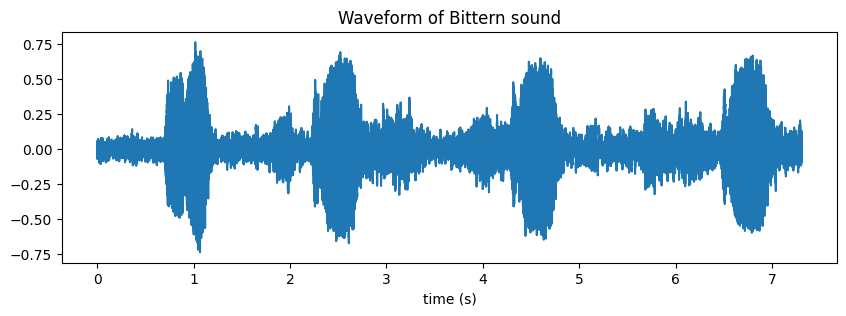

In [ ]:
# Create plot of the waveform
times = np.linspace(0, duration, num_samples)
plt.figure(figsize=(10, 3))
plt.plot(times, wav)
plt.xlabel("time (s)")
plt.title(f"Waveform of {animal_name} sound");

The **waveform** gives us a visual representation of the sound amplitude over time.

However, ff there are multiple simultaneous sounds in the recording, it can be hard to see each individual sound.

We can use a **spectrogram** to decompose the sound into **frequencies** and visualise them as a 2D image.

In [ ]:
# Compute the spectrogram with the short time fourier transform (STFT)
spectrogram = np.abs(librosa.stft(wav))

# Amplitude is best represented in logarithmic scale (decibels)
db_spectrogram = librosa.amplitude_to_db(spectrogram, ref=np.max)

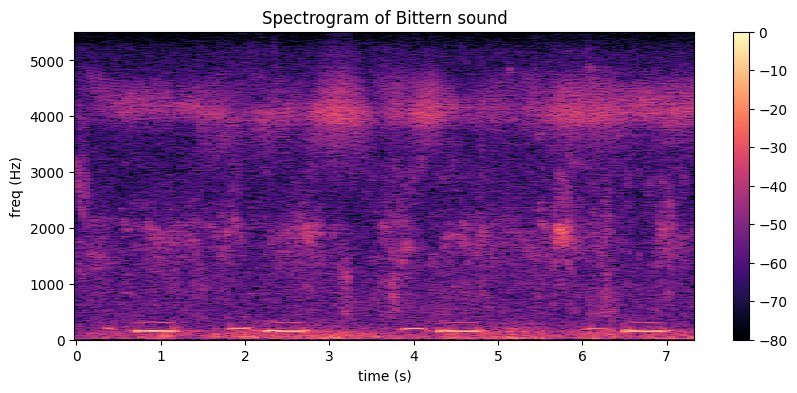

In [ ]:
# Create plot of spectrogram
num_freq_bins, num_time_bins = db_spectrogram.shape
times = np.linspace(0, duration, num_time_bins)
freqs = np.linspace(0, samplerate / 2, num_freq_bins)

plt.figure(figsize=(10, 4))
plt.pcolormesh(times, freqs, db_spectrogram, cmap="magma")
plt.colorbar()
plt.title(f"Spectrogram of {random_recording.english_name} sound")
plt.xlabel("time (s)")
plt.ylabel("freq (Hz)");

### Exercise 🐘

The sounds produced by animals can be very different from each other. The
transformation used to create the spectrogram, called the **short-time Fourier
transform** (STFT), will highlight different features of the sound depending on
the parameters used.

- Research what the STFT is and how its parameters affect the spectrogram. In
  particular, try to understand the effect of the **window size** and the **hop
  size** or **overlap**.

Here you can visualise sounds from different species and see how the STFT
parameters affect the spectrogram.

In [ ]:
# @title Interactive spectrogram of animal sounds

# @markdown Select the file you wish to visualize. Modify the spectrogram parameters to see its effect on the spectrogram. Change the reproduction speed for interesting effects!

# Select some varied sounds from avisoft dataset
examples = [
    (row.english_name, os.path.join(AVISOFT_AUDIO_DIR, row.wav))
    # select one random recording per taxonomic group
    for row in avisoft.groupby("order").sample(n=1).itertuples()
]

# Create interactive plot
ipywidgets.interact(
    plotting.plot_waveform_with_spectrogram,
    hop_length=(32, 1024, 32),
    n_fft=(32, 2048, 32),
    window=plotting.WINDOW_OPTIONS,
    file=examples,
    cmap=plotting.COLORMAPS,
    speed=[
        ("x1", 1),
        ("x1.5", 1.5),
        ("x2", 2),
        ("x0.5", 0.5),
        ("x0.2", 0.2),
        ("x0.1", 0.1),
    ],
);

interactive(children=(Dropdown(description='file', options=(('Goshawk', '/content/week4_data/data/avisoft/audi…

- Try changing the parameters and see how they affect sounds from different
  species.

- Can you see that some choice of parameters are good for some species but
  not for others?

- How do the parameters affect the computation time and resulting image size?

### Detecting sounds

As you can imagine, it is not easy to manually annotate all relevant sounds in a recording.

Look at this recording from a bat detector:

In [ ]:
YUCATAN_METADATA = DATA_DIR / "yucatan" / "yucatan_metadata.csv"

YUCATAN_AUDIO_DIR = DATA_DIR / "yucatan" / "audio"

# Load metadata of dataset of bat recordings from the yucatan peninsula
yucatan = pd.read_csv(YUCATAN_METADATA)

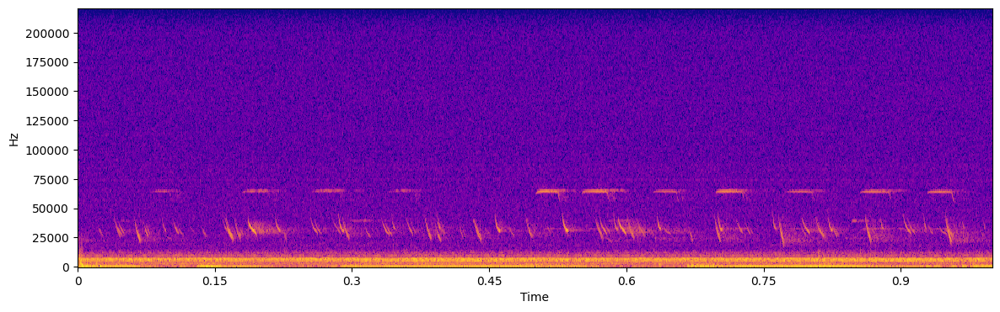

In [ ]:
crowded_recording = os.path.join(YUCATAN_AUDIO_DIR, yucatan.id[1017])

plotting.plot_spectrogram(
    crowded_recording,
    hop_length=128,
    n_fft=512,
    figsize=(14, 4),
)

There are many bat calls in this recording, it would be very time consuming to annotate them all.

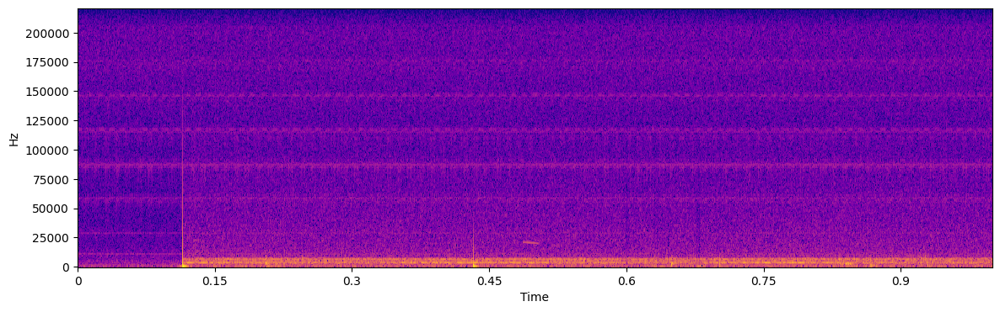

In [ ]:
empty_recording = os.path.join(YUCATAN_AUDIO_DIR, yucatan.id[205])
plotting.plot_spectrogram(
    empty_recording,
    hop_length=128,
    n_fft=512,
    figsize=(14, 4),
)

This other recording has a single bat pulse. You still need to review it thoroughly to make sure there are no other sounds of interest.

### Tadarida

Similar to **MegaDetector** for camera traps, there are some tools that automatically detect animal sounds in recordings.

Here we will explore the tool **Tadarida**. Tadarida is a non-ML generic detector that uses a set of hand-crafted features to detect sounds. It is based on the work of:

> Bas, Y., Bas, D. and Julien, J.-F., 2017. Tadarida: A Toolbox for Animal
> Detection on Acoustic Recordings. Journal of Open Research Software, 5(1),
> p.6. DOI: http://doi.org/10.5334/jors.154

We will use tadarida to detect bat calls in a recording.

In [ ]:
detections = detection.run_tadarida_detection([empty_recording, crowded_recording])

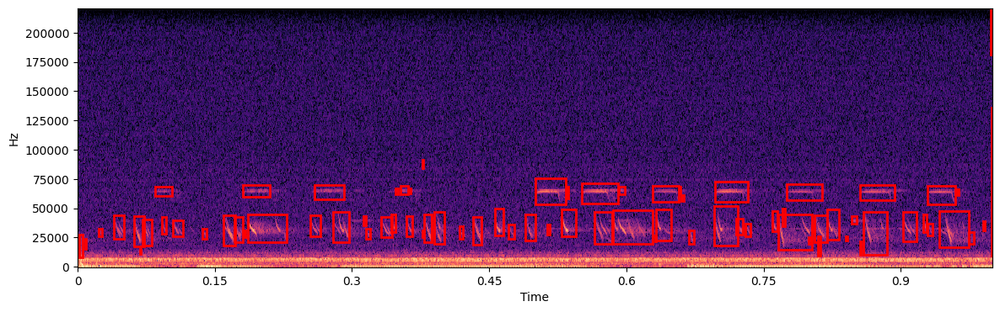

In [ ]:
plotting.plot_spectrogram_and_detection(crowded_recording, detections);

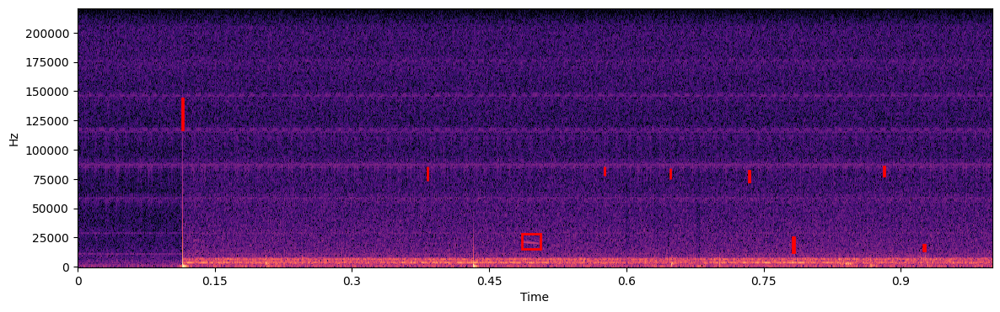

In [ ]:
plotting.plot_spectrogram_and_detection(empty_recording, detections);

### Evaluate Detections

The calls of this dataset were manually annotated, so we can compare the detections with the ground truth.

In [ ]:
YUCATAN_ANNOTATIONS = DATA_DIR / "yucatan" / "yucatan_annotations.csv"

In [ ]:
# Load the annotations file
yucatan_annotations = pd.read_csv(YUCATAN_ANNOTATIONS)

Lets first visualize the ground truth annotations.

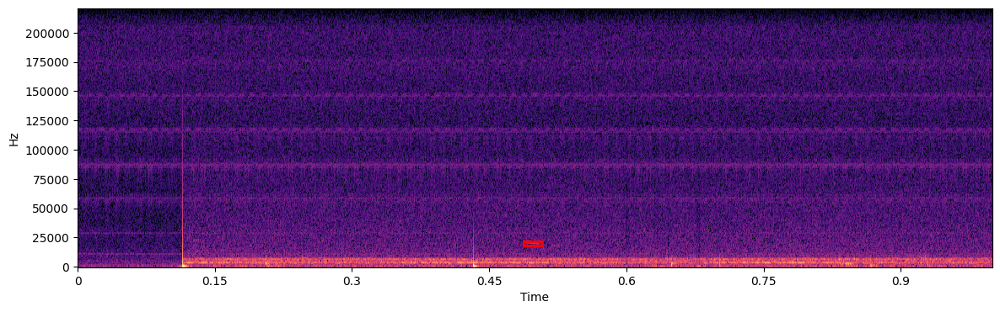

In [ ]:
plotting.plot_spectrogram_and_detection(empty_recording, yucatan_annotations);

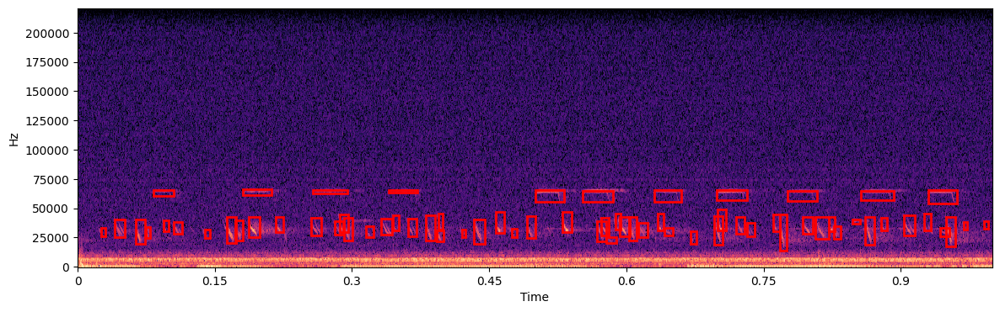

In [ ]:
plotting.plot_spectrogram_and_detection(crowded_recording, yucatan_annotations);

Now we can compare the detections with the ground truth. We can use the
Intersection over Union (IoU) to measure the overlap between the detections and
the ground truth.

<img alt="intersection over union" src="https://upload.wikimedia.org/wikipedia/commons/c/c7/Intersection_over_Union_-_visual_equation.png" width="400"></img>

In [ ]:
# Select the predictions and annotations from the crowded recording
file_detections = detections[
    detections.recording_id == os.path.basename(crowded_recording)
]
file_annotations = yucatan_annotations[
    yucatan_annotations.recording_id == os.path.basename(crowded_recording)
]

# Match the bounding boxes by computing the IoU. Discard all matches with IoU less than 0.5
pred_boxes = evaluate_detection.bboxes_from_annotations(file_detections)
true_boxes = evaluate_detection.bboxes_from_annotations(file_annotations)
matches = evaluate_detection.match_bboxes(true_boxes, pred_boxes, iou_threshold=0.5)

We select all the detections that have an IoU greater than 0.5 and count them as true positives. All the other detections are false positives. Sound events that are not detected are false negatives.

In [ ]:
# total number of annotated sound events
positives = len(file_annotations)

num_predictions = len(file_detections)

# number of matched prediction boxes
true_positives = len(matches)

# number of predicted boxes that were not matched
false_positives = num_predictions - len(matches)

# number of annotated sound events that were not matched
false_negatives = positives - len(matches)

With this information we can compute the precision and recall of the detections.

In [ ]:
# Percentage of predictions that are correct
precision = true_positives / num_predictions

# Percentage of sound events that were detected
recall = true_positives / positives

print(
    f"Tadarida precision={precision:.1%} recall={recall:.1%} on file {crowded_recording}"
)

Tadarida precision=21.8% recall=25.0% on file /content/week4_data/data/yucatan/audio/rain_tortugas_2_160803_38645_39645.wav


Lets plot predictions and annotations at the same time.

- red = spurious predicted sound event (false positive)
- green = correct prediction (true positive)
- white = missed sound event (false negative)

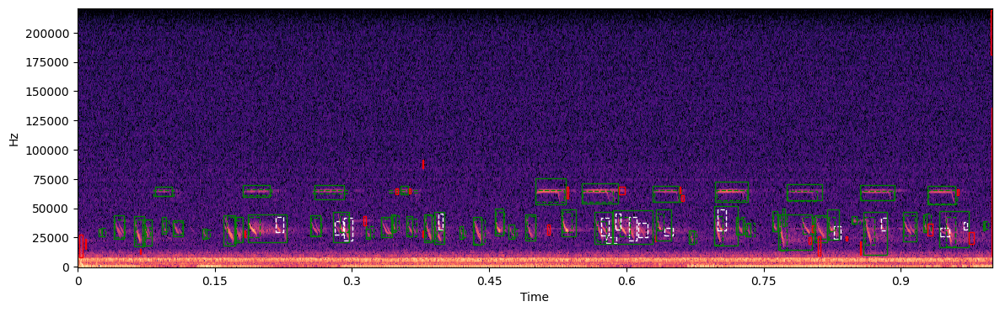

In [ ]:
plotting.plot_spectrogram_with_predictions_and_annotations(
    crowded_recording,
    detections,
    yucatan_annotations,
    iou_threshold=0.1,
);

We can also compute the precision/recall on each file in the dataset.

In [ ]:
# load precomputed tadarida detections to save some time
full_tadarida_detections = pd.read_csv(
    DATA_DIR / "yucatan" / "yucatan_tadarida_detections.csv"
)

# compute the precision and recall for each file
td_evaluation = []
for filename in yucatan_annotations.recording_id.unique():
    precision, recall = evaluate_detection.compute_file_precision_recall(
        filename,
        full_tadarida_detections,
        yucatan_annotations,
        iou_threshold=0.5,
    )
    td_evaluation.append({"wav": filename, "precision": precision, "recall": recall})

# store the results in a pandas dataframe
td_evaluation = pd.DataFrame(td_evaluation)

### Exercise 🐋

Using the dataframe with precision and recall of tadarida on each file (`td_evaluation`), calculate:

- The mean precision and recall across all files.
- The percentage of files where all bat calls were missed.
- The percentage of files where at least half of the predictions were correct.

Run the full evaluation again but change the IoU `threshold` parameter. What do you observe?

You can use the following interactive widget to get a better grasp on tadarida's behaviour.

In [ ]:
print(td_evaluation.mean())
print('----')
print('All missed')
print(len(td_evaluation[td_evaluation['precision'] == 0])/td_evaluation.shape[0])
print('----')
print('At least half correct')
print(len(td_evaluation[td_evaluation['precision'] >= 0])/td_evaluation.shape[0])

precision    0.024819
recall       0.078268
dtype: float64
----
All missed
0.6369565217391304
----
At least half correct
1.0


<ipython-input-62-d8fd1c231657>:1: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  print(td_evaluation.mean())


In [ ]:
# @title Tadarida predictions

# @markdown Select a file and an IoU threshold.

example_files = [
    os.path.join(YUCATAN_AUDIO_DIR, row["id"])
    for _, row in yucatan.sample(n=20).iterrows()
]


@ipywidgets.interact(path=example_files, iou_threshold=(0, 1, 0.1))
def plot_results_file_results(path=crowded_recording, iou_threshold=0.5):
    precision, recall = evaluate_detection.compute_file_precision_recall(
        path,
        full_tadarida_detections,
        yucatan_annotations,
        iou_threshold=iou_threshold,
    )

    print(
        f"Tadarida precision={precision:.1%} recall={recall:.1%} on file {crowded_recording}"
    )

    plotting.plot_spectrogram_with_predictions_and_annotations(
        path,
        full_tadarida_detections,
        yucatan_annotations,
        iou_threshold=iou_threshold,
    )

interactive(children=(Dropdown(description='path', options=('/content/week4_data/data/yucatan/audio/rain_tortu…

### BatDetect2

As we have seen the performance of Tadarida has room for improvement. We can improve performance by using a specialised machine learning model.

Now we will use **BatDetect2**, a deep learning model for simultaneous
detection and classification of bat calls. Although the model was trained on a
bat calls of UK bats, we can test its detection performance on the dataset of
bats from the Yucatán peninsula.

**NOTE:** Regrettably, the installation of the **batdetect2** package may be incompatible with pre-installed Colab packages. If you experience any issues post-installation, we recommend restarting your runtime and re-running previous cells while avoiding this particular section.

In [ ]:
!pip install batdetect2

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.1/7.1 MB 26.9 MB/s eta 0:00:00


In [ ]:
from batdetect2 import api
from tqdm.notebook import tqdm

In [ ]:
recordings = glob.glob(str(DATA_DIR / "yucatan" / "audio" / "*.wav"))

In [ ]:
results = []
for path in tqdm(recordings):
    results.append(api.process_file(path))

  0%|          | 0/1395 [00:00<?, ?it/s]

The **BatDetect2** model can predict multiple bounding boxes for each recording.
Unlike Tadarida, each bounding box has a **score**, a predicted species and a
confidence score for the species.

We will throw out the predicted species and confidence score, and only use the
bounding box score. The **score** is the probability that the bounding box contains
a bat call.

In [ ]:
batdetect2_predictions = []
for result in results:
    data = result["pred_dict"]
    for prediction in data["annotation"]:
        batdetect2_predictions.append({
            'det_prob': prediction["det_prob"],
            'start_time': prediction["start_time"],
            'end_time': prediction["end_time"],
            'high_freq': prediction["high_freq"],
            'low_freq': prediction["low_freq"],
            'recording_id': data["id"],
        })

# And collect them into a single dataframe
batdetect2_predictions = pd.DataFrame(batdetect2_predictions)

We can then use the same evaluation procedure as before to compute the
precision and recall, except now we can select detections with a score greater
than some customizable threshold.

In [ ]:
batdetect2_predictions.head()

,det_prob,start_time,end_time,high_freq,low_freq,recording_id
0,0.036,0.0015,0.0119,21085,12578,dry_noyaxche_1_130304_49209_50209.wav
1,0.030,0.0015,0.0081,35908,23750,dry_noyaxche_1_130304_49209_50209.wav
2,0.025,0.0015,0.0320,82269,69296,dry_noyaxche_1_130304_49209_50209.wav
3,0.038,0.0115,0.0417,111554,93359,dry_noyaxche_1_130304_49209_50209.wav
4,0.029,0.0285,0.0621,80686,68437,dry_noyaxche_1_130304_49209_50209.wav


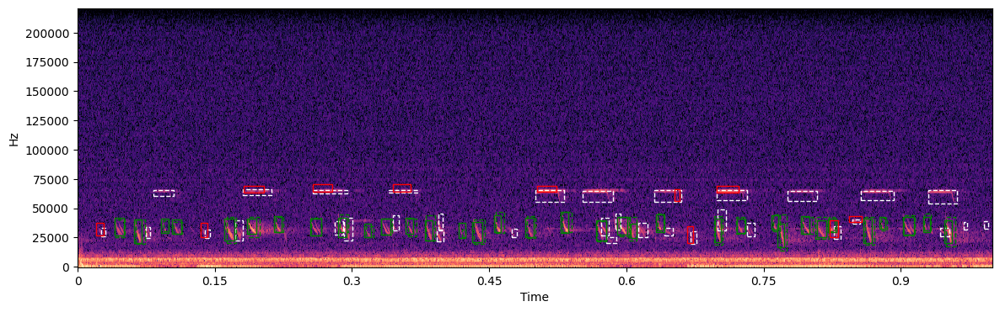

In [ ]:
score_threshold = 0.3

plotting.plot_spectrogram_with_predictions_and_annotations(
    crowded_recording,
    batdetect2_predictions[batdetect2_predictions.det_prob > score_threshold],
    yucatan_annotations,
    iou_threshold=0.3,
);

In [ ]:
# @title Batdetect2 predictions

# @markdown Select a file and an IoU threshold.

example_files = [
    os.path.join(YUCATAN_AUDIO_DIR, row["id"])
    for _, row in yucatan.sample(n=20).iterrows()
]


@ipywidgets.interact(
    path=example_files,
    iou_threshold=(0, 1, 0.1),
    score_threshold=(0, 1, 0.1),
)
def plot_batdetect2_results_file_results(
    path=crowded_recording,
    iou_threshold=0.5,
    score_threshold=0.3,
):
    confident_detections = batdetect2_predictions[
        batdetect2_predictions.det_prob > score_threshold
    ]

    precision, recall = evaluate_detection.compute_file_precision_recall(
        path,
        confident_detections,
        yucatan_annotations,
        iou_threshold=iou_threshold,
    )

    print(
        f"Batdetect2 precision={precision:.1%} recall={recall:.1%} on file {crowded_recording}"
    )

    plotting.plot_spectrogram_with_predictions_and_annotations(
        path,
        confident_detections,
        yucatan_annotations,
        iou_threshold=iou_threshold,
        linewidth=2,
    )

interactive(children=(Dropdown(description='path', options=('/content/week4_data/data/yucatan/audio/dry_benita…

### Exercise 🐸

Here you will compare the performance of the two detectors.

1. Use the function `evaluate_detection.compute_detection_metrics` to calculate the number
of positive, true positives, false positives and false negatives for each file.

In [ ]:
batdetect2_predictions

,det_prob,start_time,end_time,high_freq,low_freq,recording_id
0,0.036,0.0015,0.0119,21085,12578,dry_noyaxche_1_130304_49209_50209.wav
1,0.030,0.0015,0.0081,35908,23750,dry_noyaxche_1_130304_49209_50209.wav
2,0.025,0.0015,0.0320,82269,69296,dry_noyaxche_1_130304_49209_50209.wav
3,0.038,0.0115,0.0417,111554,93359,dry_noyaxche_1_130304_49209_50209.wav
4,0.029,0.0285,0.0621,80686,68437,dry_noyaxche_1_130304_49209_50209.wav
...,...,...,...,...,...,...
139775,0.027,1.0045,1.0112,39842,30625,rain_stateresa_1_270803_42880_43880.wav
139776,0.032,1.0225,1.0576,80557,68437,rain_stateresa_1_270803_42880_43880.wav
139777,0.043,1.0245,1.0356,37427,23750,rain_stateresa_1_270803_42880_43880.wav
139778,0.042,1.0245,1.0446,108414,93359,rain_stateresa_1_270803_42880_43880.wav


In [ ]:
# as an example here is how you use the function
example_file = example_files[0]

confident_detections = batdetect2_predictions[batdetect2_predictions.det_prob > 0.3]

(
    positives,
    true_positives,
    false_positives,
    false_negatives,
) = evaluate_detection.compute_detection_metrics(
    example_file,
    confident_detections,
    yucatan_annotations,
    iou_threshold=0.5,
)

print(
    f"{positives = }, {true_positives = }, {false_positives = }, {false_negatives = }"
)

positives = 10, true_positives = 1, false_positives = 11, false_negatives = 9


2. Compute the overall precision and recall for each detector.

3. Which detector performs better?

4. How does this change if you change the score threshold?

In [ ]:
files = [
    os.path.join(YUCATAN_AUDIO_DIR, row["id"])
    for _, row in yucatan.iterrows()
]

In [ ]:
confident_detections = batdetect2_predictions[batdetect2_predictions.det_prob > 0.3]
confident_detections2 = detections
for f in files[:5]:
  print('-'*10)
  print(f)
  print('-'*10)
  (
      positives,
      true_positives,
      false_positives,
      false_negatives,
  ) = evaluate_detection.compute_detection_metrics(
      f,
      confident_detections,
      yucatan_annotations,
      iou_threshold=0.5,
  )
  print('Bat2Detection')
  print(
      f"{positives = }, {true_positives = }, {false_positives = }, {false_negatives = }"
  )
  print('-'*10)
  (
      positives,
      true_positives,
      false_positives,
      false_negatives,
  ) = evaluate_detection.compute_detection_metrics(
      f,
      confident_detections2,
      yucatan_annotations,
      iou_threshold=0.5,
  )
  print('Tadarida')
  print(
      f"{positives = }, {true_positives = }, {false_positives = }, {false_negatives = }"
  )
  print('')
  print('')


----------
/content/week4_data/data/yucatan/audio/dry_azul_1_140305_54686_55686.wav
----------
Bat2Detection
positives = 10, true_positives = 1, false_positives = 6, false_negatives = 9
----------
Tadarida
positives = 10, true_positives = 0, false_positives = 0, false_negatives = 10


----------
/content/week4_data/data/yucatan/audio/dry_azul_3_240204_30508_31508.wav
----------
Bat2Detection
positives = 3, true_positives = 0, false_positives = 1, false_negatives = 3
----------
Tadarida
positives = 3, true_positives = 0, false_positives = 0, false_negatives = 3


----------
/content/week4_data/data/yucatan/audio/dry_azul_1_240204_15750_16750.wav
----------
Bat2Detection
positives = 19, true_positives = 3, false_positives = 14, false_negatives = 16
----------
Tadarida
positives = 19, true_positives = 0, false_positives = 0, false_negatives = 19


----------
/content/week4_data/data/yucatan/audio/dry_benita_2_130205_48770_49770.wav
----------
Bat2Detection
positives = 1, true_positives = 

In [ ]:
# OVERALL

confident_detections = batdetect2_predictions[batdetect2_predictions.det_prob > 0.3]
# confident_detections2 = detections

sum_positives = 0
sum_true_positives = 0
sum_false_positives = 0
sum_false_negatives = 0

for f in files:
  # print('-'*10)
  # print(f)
  # print('-'*10)
  (
      positives,
      true_positives,
      false_positives,
      false_negatives,
  ) = evaluate_detection.compute_detection_metrics(
      f,
      confident_detections,
      yucatan_annotations,
      iou_threshold=0.5,
  )

  sum_positives += positives
  sum_true_positives += true_positives
  sum_false_positives += false_positives
  sum_false_negatives += false_negatives

print('Precision Bat2Detection')
print(sum_true_positives/(sum_true_positives + sum_false_positives))
  # print('Bat2Detection')
  # print(
  #     f"{positives = }, {true_positives = }, {false_positives = }, {false_negatives = }"
  # )
  # print('-'*10)
  # (
  #     positives,
  #     true_positives,
  #     false_positives,
  #     false_negatives,
  # ) = evaluate_detection.compute_detection_metrics(
  #     f,
  #     confident_detections2,
  #     yucatan_annotations,
  #     iou_threshold=0.5,
  # )
  # print('Tadarida')
  # print(
  #     f"{positives = }, {true_positives = }, {false_positives = }, {false_negatives = }"
  # )
  # print('')
  # print('')


0.318246920653108


In [ ]:
# OVERALL CHANGING THRESHOLD

prec_list = []
recall_list = []
fscore_list = []


det_prob_val = [0.1*i for i in range(1,9)]
for d in det_prob_val:
  confident_detections = batdetect2_predictions[batdetect2_predictions.det_prob > d]

  sum_positives = 0
  sum_true_positives = 0
  sum_false_positives = 0
  sum_false_negatives = 0

  for f in files:
    (
        positives,
        true_positives,
        false_positives,
        false_negatives,
    ) = evaluate_detection.compute_detection_metrics(
        f,
        confident_detections,
        yucatan_annotations,
        iou_threshold=0.5,
    )

    sum_positives += positives
    sum_true_positives += true_positives
    sum_false_positives += false_positives
    sum_false_negatives += false_negatives

  precision = sum_true_positives/(sum_true_positives + sum_false_positives)
  recall = sum_true_positives/sum_positives
  fscore = 2*precision*recall/(precision+recall)

  prec_list.append(precision)
  recall_list.append(recall)
  fscore_list.append(fscore)

  print('Precision Bat2Detection')
  print('detection prob threshold', d)
  print('Precision', precision)
  print('Recall', recall)
  print('F-score', )
  print('')


Precision Bat2Detection
detection prob threshold 0.1
Precision 0.17713787085514834
Recall 0.35492957746478876
F-score

Precision Bat2Detection
detection prob threshold 0.2
Precision 0.2549587375126683
Recall 0.34210781932977175
F-score

Precision Bat2Detection
detection prob threshold 0.30000000000000004
Precision 0.318246920653108
Recall 0.3237493929091792
F-score

Precision Bat2Detection
detection prob threshold 0.4
Precision 0.3885366472229267
Recall 0.29762020398251576
F-score

Precision Bat2Detection
detection prob threshold 0.5
Precision 0.4838181818181818
Recall 0.25847498785818357
F-score

Precision Bat2Detection
detection prob threshold 0.6000000000000001
Precision 0.5927819548872181
Recall 0.191452161243322
F-score

Precision Bat2Detection
detection prob threshold 0.7000000000000001
Precision 0.7018837018837019
Recall 0.08324429334628461
F-score

Precision Bat2Detection
detection prob threshold 0.8
Precision 0.75
Recall 0.009616318601262748
F-score



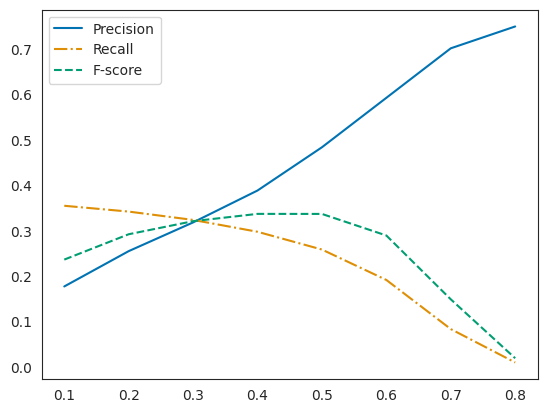

In [ ]:

sns.set_style('white')
sns.set_palette('colorblind')
sns.lineplot(x=det_prob_val, y=prec_list, label = 'Precision', linestyle = '-')
sns.lineplot(x=det_prob_val, y=recall_list, label = 'Recall', linestyle = '-.')
sns.lineplot(x=det_prob_val, y=fscore_list, label = 'F-score', linestyle = '--')
plt.show()

## Part 2: Identifying Sounds

- In the previous section we saw how to detect sounds in a recording. But we still need to identify the species that produced the sound.

- Generally, classification is more challenging than detection, as the sounds produced by different species can be very similar (**interspecific overlap**).

- A single species can have flexible vocalisations, think humans or mimic birds such as starling (**intraspecific variation**).

- Bioacoustic data presents similar challenges to the camera trap datasets as recordings can be:
    - **Ocluded** (Simultaneous sounds)
    - **Appear in varying ambient condition**s (rain/wind/thunder)
    - **Partial** (Only captured half the sound)
    - **Noisy** (Saturation and faulty sensor)
    - **Quiet or very loud** (depending on animal size, distance, environment)

For the rest of this notebook we will focus on **10** bat species present in the Yucatán dataset.

In [ ]:
SPECIES = [
    "Mormoops megalophylla",
    "Myotis keaysi",
    "Saccopteryx bilineata",
    "Pteronotus davyi",
    "Pteronotus parnellii",
    "Lasiurus ega",
    "Pteropteryx macrotis",
    "Eumops underwoodi",
    "Rhogeessa aeneus",
    "Eptesicus furinalis",
]

In [ ]:
classification_df = yucatan_annotations[yucatan_annotations["class"].isin(SPECIES)]

### Bat call features

- Previous research on bat call identification was based on hand-crafted features of the bat calls.

- Measuring call features used to be a manual process.

<img src="https://www.elekon.ch/batexplorer2/doc/_images/CallParams.png" alt="call parameters" width="400"/>

> Image taken from the [BatExplorer 2.1 user guide](https://www.elekon.ch/batexplorer2/doc/batcall_params.html).

**Peak frequency [kHz]:**

>    The frequency at which the call is loudest (peak in the spectrum display), aka frequency of maximum energy (FME) or main frequency.
>    Most important parameter for bat classification because it can easily be measured and is often typical for a certain species or group of species.
>    The standard deviation of the peak frequency allows the detection of alternating calling species.
    
**Max frequency [kHz]**

>    The maximum frequency of the call. Often this is equal to the start frequency, for Rhinolophidae typically equal to the peak frequency.
    
**Min frequency [kHz]**

>    The minimum frequency of the call. Often this is equal to the end frequency, for hockey stick calls (e.g. Pipistrelle) it might be lower than the end frequency.
    
**BW Peak2Min [kHz]**

>    Bandwidth Peak2Min = Peak frequency - Min frequency
>    Often used to distinguish Myotis and Pipistrelle calls, Myotis mostly have higher bandwidth.
    
**Call length [ms]**

>    Time period of call start to call end in ms. Can be measured most accurately in the oscillogram (wave rise to wave drop).
>    Search calls from European bats are usually between one and up to approximately 30 ms (horseshoe bats up to 80 ms).
    
**Call distance [ms]**

>    Time period between two consecutive calls in ms. Can be measured most accurately in the oscillogram (wave rise call A to wave rise call B).
>    Often this parameter is not very significant since most bat species have irregular rhythms. But it can be an indicator for behavior.
>    Search calls from European bats usually have distances of about 30 to 300 ms, sometimes even longer.


### Exercise 🐦

* Explore 1 calls per species
* Measure peak frequency, max frequency, min frequency and call length
* Store in a dataframe
* Scatterplot

In [ ]:
from google.colab import output
import plotly.graph_objects as go
output.enable_custom_widget_manager()

In [ ]:
to_annotate = classification_df.groupby("class").sample(n=1)


@ipywidgets.interact(
    index=[
        (f"{r['class']}_{index}", i)
        for i, (index, r) in enumerate(to_annotate.iterrows())
    ]
)
def manually_extract_features_from_spectrogram(index=0):
    row = to_annotate.iloc[index]
    fig = plotting.plot_spectrogram_with_plotly(
        path=os.path.join(YUCATAN_AUDIO_DIR, row["recording_id"]),
        start_time=row["start_time"],
        end_time=row["end_time"],
        low_freq=row["low_freq"],
        high_freq=row["high_freq"],
    )
    return go.FigureWidget(data=fig.data, layout=fig.layout)

interactive(children=(Dropdown(description='index', options=(('Eptesicus furinalis_7318', 0), ('Eumops underwo…

### Tadarida automated features

- Tadarida extracts a large set of features from each detected sound event.

- It is possible to build a pipeline for automated species identification using of automatic feature extraction process.

- First we detect the sounds in the recording, then we extract the features, and
  finally we classify the sounds.

- The classification is done using the extracted features a classifier
  algorithm, like Random Forest classifier.

In [ ]:
# here we load tadarida extracted features
tadarida_features = pd.read_csv(DATA_DIR / "yucatan" / "yucatan_tadarida_features.csv")

# the dataframe contains the class of each detected pulse and
# a suite of automatically extracted parameters
species = tadarida_features["Class"]

print(f"Number of features = {len(TADARIDA_FEATURES)}")
features = tadarida_features[TADARIDA_FEATURES]

Number of features = 147


In [ ]:
# Now we will split the data into train a test
X_train, X_test, y_train, y_test = train_test_split(
    features,
    species,
    test_size=0.3,
    stratify=species,  # notice we are using the stratified argument
)

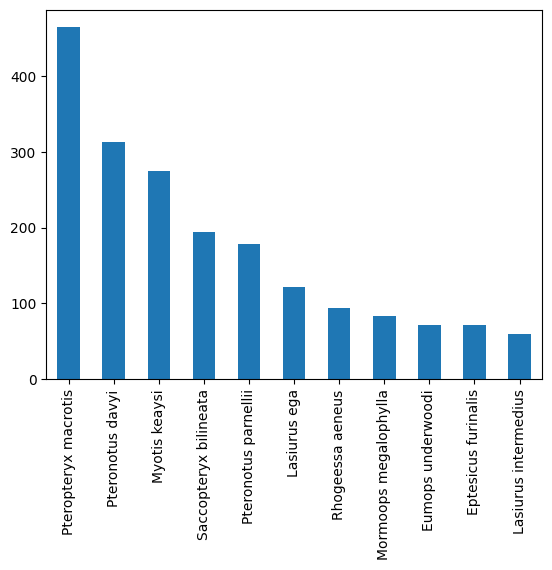

In [ ]:
# Lets see the number of examples per species in each dataset
# Train dataset
y_train.value_counts().plot.bar();

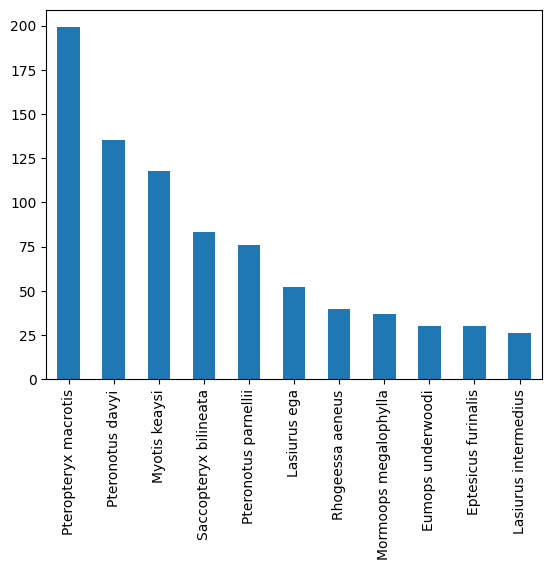

In [ ]:
# Test dataset
y_test.value_counts().plot.bar();

Now we are ready to train a classifier to identify the species of the bat calls.

We will use a **Random Forest Classifier** from `scikit-learn`.

In [ ]:
# build a random forest model
rf_model = RandomForestClassifier()

# fit to training data
rf_model.fit(X_train, y_train)

RandomForestClassifier()

We can evaluate the performance of the classifier in a similar fashion to previous practicals.

There is a useful `classification_report` function from `sklearn.metrics` to compute the precision, recall and F1 score for each species.

In [ ]:
# predict with rf model on evaluation data
y_pred = rf_model.predict(X_test)

print(classification_report(y_true=y_test, y_pred=y_pred))

                       precision    recall  f1-score   support

  Eptesicus furinalis       0.93      0.47      0.62        30
    Eumops underwoodi       0.73      0.80      0.76        30
         Lasiurus ega       0.73      0.83      0.77        52
 Lasiurus intermedius       0.42      0.31      0.36        26
Mormoops megalophylla       0.94      0.89      0.92        37
        Myotis keaysi       0.81      0.81      0.81       118
     Pteronotus davyi       0.81      0.86      0.83       135
 Pteronotus parnellii       0.99      0.92      0.95        76
 Pteropteryx macrotis       0.89      0.99      0.94       199
     Rhogeessa aeneus       0.94      0.75      0.83        40
Saccopteryx bilineata       0.96      0.93      0.94        83

             accuracy                           0.86       826
            macro avg       0.83      0.78      0.79       826
         weighted avg       0.86      0.86      0.85       826



### Exercise 🦗

In this exercise you will analyze the model's performance in depth.

1. Plot the confusion matrix using the `sklearn.metrics.ConfusionMatrixDisplay` from scikit learn.

If you are confused it is always helpful to look at the [documentation](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.ConfusionMatrixDisplay.html) and provided examples.

2. Which are the worst performing species? Can you see why? You might need to go back and see some more examples of bat calls.

### Universal feature set

- Is Tadarida's feature set optimal for bat call identification?

- There is a huge amount of information in the recorded audio that we are throwing away by using hand-crafted features.

- Can we learn a better feature set from the data?

Here instead of relying on hand-crafted features we will use acoustic feature extractor called [Yamnet](https://github.com/tensorflow/models/tree/master/research/audioset/yamnet).

Yamnet was trained on [AudioSet](http://research.google.com/audioset/) a massive dataset of YouTube recordings with more than 5.8 thousand hours of audio.

It was trained to classify sounds clips into 527 different classes. The features it learned to extract are thus useful to distinguish and identify a large variety of sounds.

<img src="http://research.google.com/audioset/resources/histogram.svg" alt="audioset dataset" width="400"/>

Audioset does not contain ultrasonic recordings, and thus is devoid of bat sounds. However, we expect the learnt features to be sufficiently general that it can help identify bat calls.

First we need to download the model. Thankfully the model is available in [Tensorflow Hub](https://tfhub.dev/), a repository of pre-trained models.

In [ ]:
# Here we will load the model using tensorflow_hub
yamnet = hub.load("https://tfhub.dev/google/yamnet/1")

Next we will load all the audio bits from the dataset and extract the features using the model.

The yamnet was originally trained with 0.96 second audio clips sampled at 16kHz.

All our recordings have a samplerate of 441kHz so we will only feed the model with 34ms of audio at a time.

We will center each audio clip on the bat calls.

In [ ]:
# Here we will load the information of where each bat call starts and ends
audio_clips = pd.read_csv(DATA_DIR / "yucatan" / "yucatan_species_clips.csv")

In [ ]:
audios = []
for _, row in audio_clips.iterrows():
    wav = load_bat_call_audio_data(
        str(YUCATAN_AUDIO_DIR / row.recording_id), row.start_time, row.end_time
    )
    audios.append(wav)

In [ ]:
features = []
for wav in tqdm(audios):
    scores, feats, spectrogram = yamnet(wav)
    features.append(feats.numpy().squeeze())
features = np.array(features)

  0%|          | 0/2751 [00:00<?, ?it/s]

Notice the yamnet model returns a set of 1024 features for each audio bit.

In [ ]:
print(features.shape)

(2751, 1024)


We can visualize the features using the dimensionality reduction technique
explore in the previous practicals, [UMAP](https://umap-learn.readthedocs.io/en/latest/).

We will compare tadarida's features with the features extracted by yamnet.

In [ ]:
umap_yamnet = UMAP().fit_transform(features)

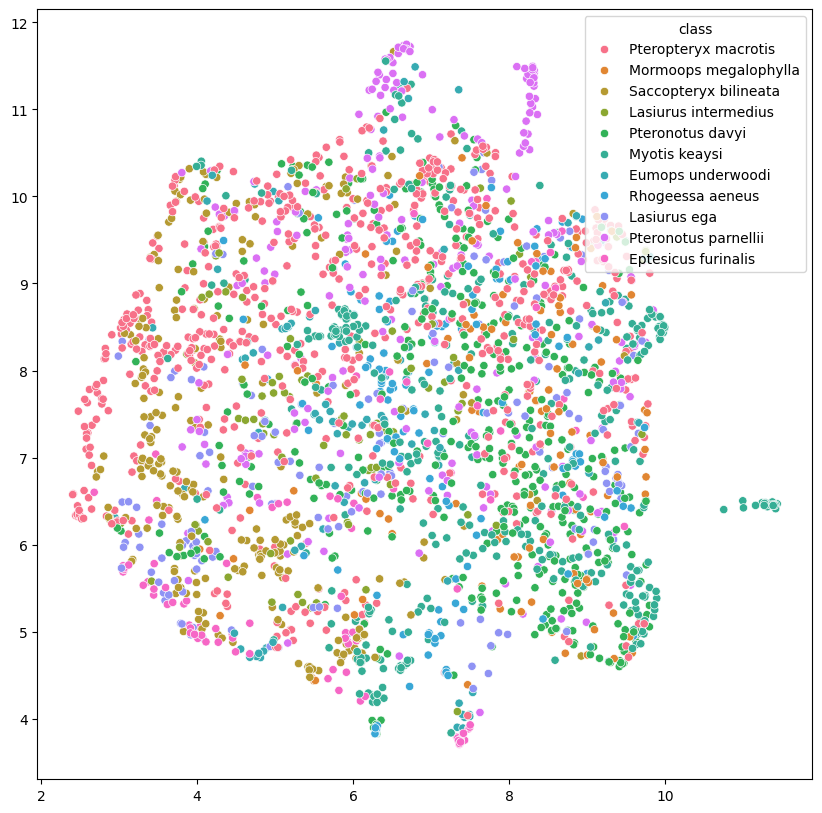

In [ ]:
X, Y = umap_yamnet.T
plt.figure(figsize=(10, 10))
sns.scatterplot(x=X, y=Y, hue=audio_clips["class"]);

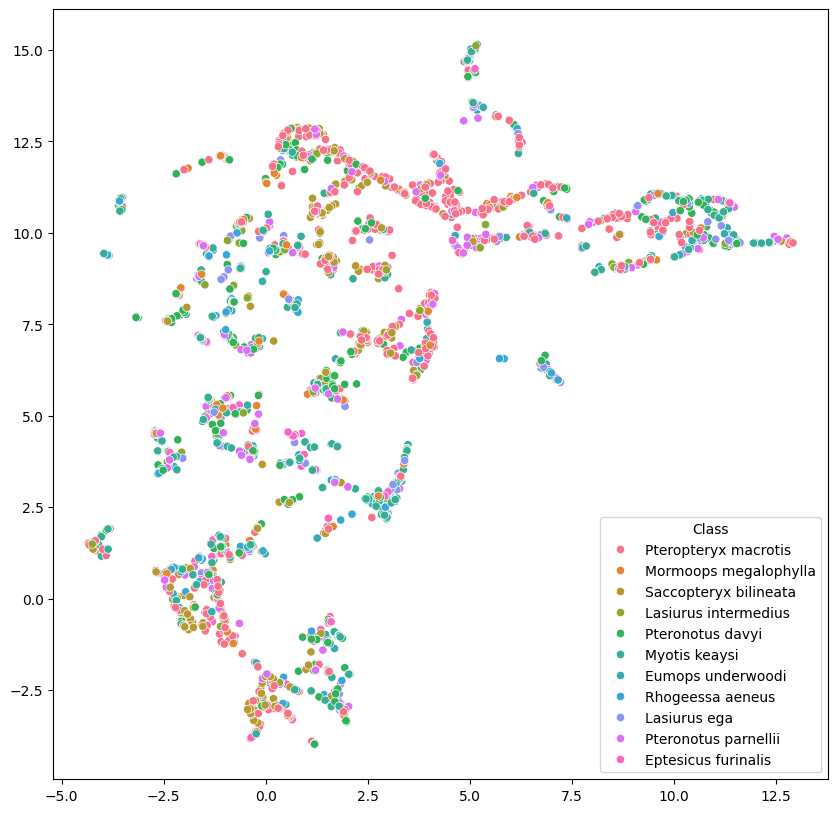

In [ ]:
X_tadarida = tadarida_features[TADARIDA_FEATURES]
y_tadarida = tadarida_features["Class"]

umap_tadarida = UMAP().fit_transform(X_tadarida)
X, Y = umap_tadarida.T
plt.figure(figsize=(10, 10))
sns.scatterplot(x=X, y=Y, hue=y_tadarida);

Its hard to evaluate between the two feature sets by just these plots. In the next exercise we will train a classifier using the features extracted by Yamnet.

### Exercise 🐝

Here you will build a random forest classifier using the features extracted by Yamnet.

1. Split the data into train and test. You can copy the code from the previous exercise.

2. Train a random forest classifier using the training data.

3. Evaluate the performance using the classification_report function.

4. Plot the confusion matrix.

5. Was this better? What are the advantages and disadvantages of using a
   pre-trained model?

### Exercise 🦐 (Optional)

Fine tune the Yamnet model the bat data.